<a href="https://colab.research.google.com/github/shivani983/computer-vision-handson/blob/main/blindwalk_assistant.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!nvidia-smi

Sun Mar 15 10:17:30 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   40C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 64.3 MB/s eta 0:00:00


In [3]:
from ultralytics import YOLO
import os

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
!ls "/content/drive/MyDrive/blindwalk_assistant"


'Safe walk bd.v1i.yolov11.zip'


In [6]:
!unzip "/content/drive/MyDrive/blindwalk_assistant/Safe walk bd.v1i.yolov11.zip" -d /content/dataset

Archive:  /content/drive/MyDrive/blindwalk_assistant/Safe walk bd.v1i.yolov11.zip
  inflating: /content/dataset/README.dataset.txt  
  inflating: /content/dataset/README.roboflow.txt  
  inflating: /content/dataset/data.yaml  
   creating: /content/dataset/test/
   creating: /content/dataset/test/images/
 extracting: /content/dataset/test/images/4K-Bangladeshi-walking-tour-Dhaka-city-2023-Bason-Thana-Gazipur-Walking-Tour-2023_108_jpg.rf.8f8c45894220961c4a931d5fcb7f913a.jpg  
 extracting: /content/dataset/test/images/4K-Bangladeshi-walking-tour-Dhaka-city-2023-Bason-Thana-Gazipur-Walking-Tour-2023_10_jpg.rf.bacf000ae86f81fcad47b34f77cabc79.jpg  
 extracting: /content/dataset/test/images/4K-Bangladeshi-walking-tour-Dhaka-city-2023-Bason-Thana-Gazipur-Walking-Tour-2023_122_jpg.rf.5cd7239fdcb8374fbb9e2cc2318bce32.jpg  
 extracting: /content/dataset/test/images/4K-Bangladeshi-walking-tour-Dhaka-city-2023-Bason-Thana-Gazipur-Walking-Tour-2023_123_jpg.rf.7c8f08376f430dd7cfbcaf62542fcb43.jpg  

In [7]:
!ls /content/dataset

data.yaml  README.dataset.txt  README.roboflow.txt  test  train  valid


In [8]:
!cat /content/dataset/data.yaml

train: ../train/images
val: ../valid/images
test: ../test/images

nc: 32
names: ['Animal', 'Bench', 'Bollard', 'Broken-road', 'Car', 'Cat', 'Construction-barrier', 'Crosswalk', 'Curb', 'Dog', 'Downstairs', 'Fallen-tree', 'Fence', 'Garbage', 'Garbage-bin', 'Light-pole', 'Motorcycle', 'Muddy road', 'Obstacle', 'Person', 'Pole', 'Pothole', 'Railroad-crossing', 'Rickshaw', 'Sidewalk', 'Stuck-water', 'Traffic-cone', 'Traffic-light', 'Traffice-sign', 'Tree', 'Vehicle', 'Wall']

roboflow:
  workspace: shivi-to7em
  project: safe-walk-bd-dy7dc
  version: 1
  license: CC BY 4.0
  url: https://universe.roboflow.com/shivi-to7em/safe-walk-bd-dy7dc/dataset/1

In [9]:
import yaml

yaml_path = "/content/dataset/data.yaml"

with open(yaml_path, "r") as f:
    data = yaml.safe_load(f)

data["path"] = "/content/dataset"
data["train"] = "train/images"
data["val"] = "valid/images"
data["test"] = "test/images"

with open(yaml_path, "w") as f:
    yaml.dump(data, f)

print("data.yaml fixed successfully")

data.yaml fixed successfully


In [10]:
from ultralytics import YOLO

model = YOLO("yolo11s.pt")

model.train(
    data="/content/dataset/data.yaml",
    epochs=120,
    imgsz=640,
    batch=16,
    device=0
)

Ultralytics 8.4.22 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/dataset/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=120, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11s.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0,

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  3,  4,  6,  8,  9, 10, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 29, 30, 31])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x79b6220ee420>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.04104

In [11]:
model.val()

Ultralytics 8.4.22 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO11s summary (fused): 101 layers, 9,425,184 parameters, 0 gradients, 21.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1191.7±289.2 MB/s, size: 67.3 KB)
val: Scanning /content/dataset/valid/labels.cache... 165 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 165/165 33.0Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 11/11 1.8it/s 6.3s
                   all        165       1752      0.509      0.613      0.583      0.468
                Animal          6         13      0.541      0.615      0.505      0.317
           Broken-road          1          1      0.416      0.833      0.497      0.497
                   Car         27         27      0.616      0.741      0.704      0.609
  Construction-barrier         12         13      0.514      0.769      0.696      0.507
                  Curb         12         12 

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  3,  4,  6,  8,  9, 10, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 29, 30, 31])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x79b953a45ac0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.04104

In [13]:
!ls /content/runs/detect/train/weights


best.pt  last.pt


In [14]:
!cp /content/runs/detect/train/weights/best.pt /content/drive/MyDrive/blindwalk_assistant/best_model.pt

In [15]:
!ls /content/drive/MyDrive/blindwalk_assistant

 best_model.pt	'Safe walk bd.v1i.yolov11.zip'


In [16]:
from ultralytics import YOLO

model = YOLO("/content/runs/detect/train/weights/last.pt")

In [17]:
!ls /content/runs/detect/train/weights

best.pt  last.pt


In [20]:
model.train(
    data="/content/dataset/data.yaml",
    epochs=80,   # jitne aur epochs train karna chaho
    imgsz=640
)

Ultralytics 8.4.22 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/dataset/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=80, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/runs/detect/train/weights/last.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train4, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  3,  4,  6,  8,  9, 10, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 29, 30, 31])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x79b7a817c770>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.04104

In [22]:
!ls /content/runs/detect/train4/weights

best.pt  last.pt


In [25]:
from ultralytics import YOLO

model = YOLO("/content/runs/detect/train/weights/best.pt")

results = model.predict(
    source="/content/dataset/test/images/4K-Bangladeshi-walking-tour-Dhaka-city-2023-Bason-Thana-Gazipur-Walking-Tour-2023_226_jpg.rf.53506298ccfc551ac10f207032099852.jpg",
    conf=0.25,
    save=True
)


image 1/1 /content/dataset/test/images/4K-Bangladeshi-walking-tour-Dhaka-city-2023-Bason-Thana-Gazipur-Walking-Tour-2023_226_jpg.rf.53506298ccfc551ac10f207032099852.jpg: 640x640 1 Garbage, 1 Muddy road, 5 Obstacles, 3 Poles, 1 Stuck-water, 2 Trees, 4 Vehicles, 1 Wall, 15.6ms
Speed: 2.4ms preprocess, 15.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /content/runs/detect/predict


In [27]:
results = model.predict(
    source="/content/dataset/test/images",
    conf=0.25,
    save=True
)


image 1/82 /content/dataset/test/images/4K-Bangladeshi-walking-tour-Dhaka-city-2023-Bason-Thana-Gazipur-Walking-Tour-2023_108_jpg.rf.8f8c45894220961c4a931d5fcb7f913a.jpg: 640x640 1 Bollard, 1 Curb, 2 Dogs, 1 Garbage, 1 Muddy road, 5 Poles, 3 Vehicles, 1 Wall, 15.8ms
image 2/82 /content/dataset/test/images/4K-Bangladeshi-walking-tour-Dhaka-city-2023-Bason-Thana-Gazipur-Walking-Tour-2023_10_jpg.rf.bacf000ae86f81fcad47b34f77cabc79.jpg: 640x640 1 Car, 1 Muddy road, 2 Poles, 7 Vehicles, 15.6ms
image 3/82 /content/dataset/test/images/4K-Bangladeshi-walking-tour-Dhaka-city-2023-Bason-Thana-Gazipur-Walking-Tour-2023_122_jpg.rf.5cd7239fdcb8374fbb9e2cc2318bce32.jpg: 640x640 1 Curb, 1 Dog, 1 Garbage, 1 Muddy road, 2 Poles, 1 Rickshaw, 1 Sidewalk, 5 Vehicles, 15.6ms
image 4/82 /content/dataset/test/images/4K-Bangladeshi-walking-tour-Dhaka-city-2023-Bason-Thana-Gazipur-Walking-Tour-2023_123_jpg.rf.7c8f08376f430dd7cfbcaf62542fcb43.jpg: 640x640 1 Garbage, 1 Pole, 1 Rickshaw, 1 Sidewalk, 5 Vehicles, 

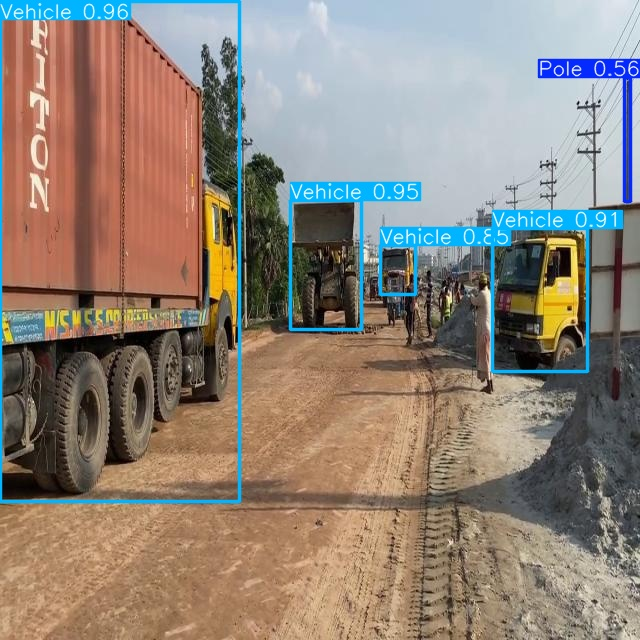

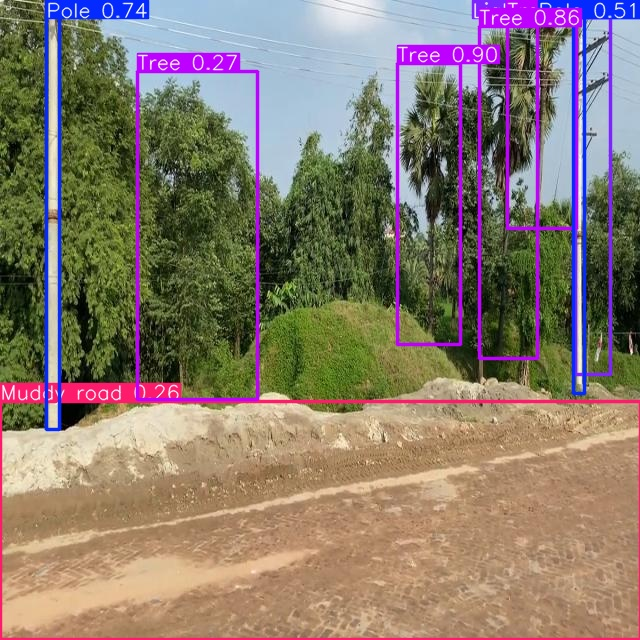

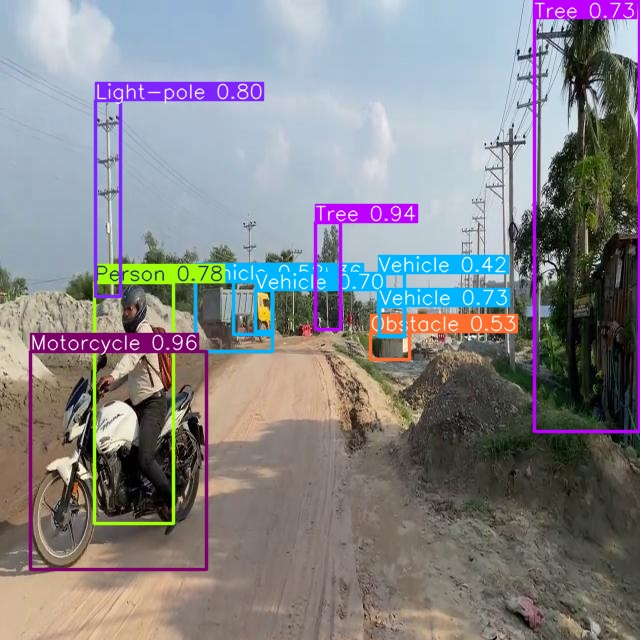

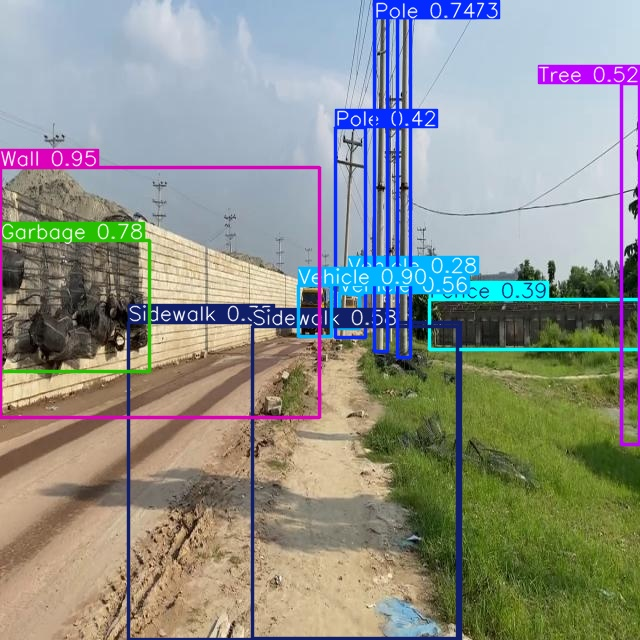

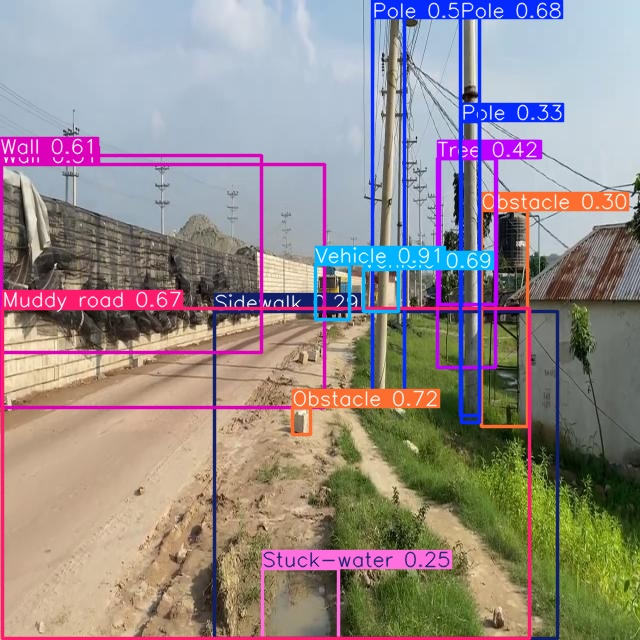

...

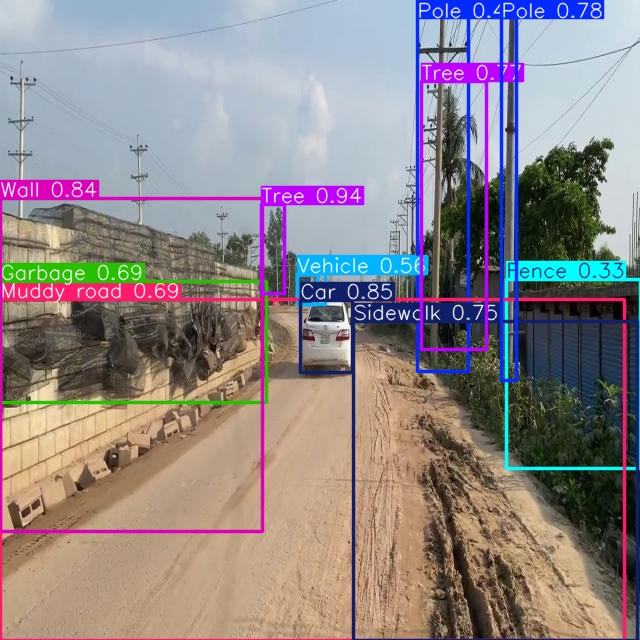

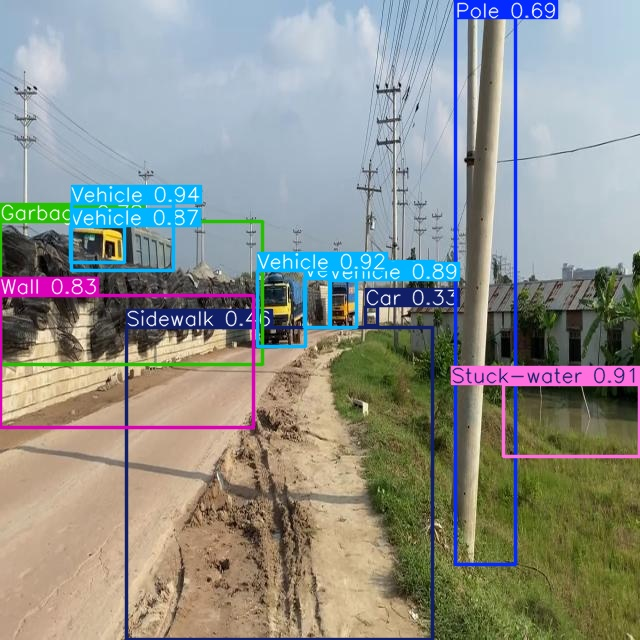

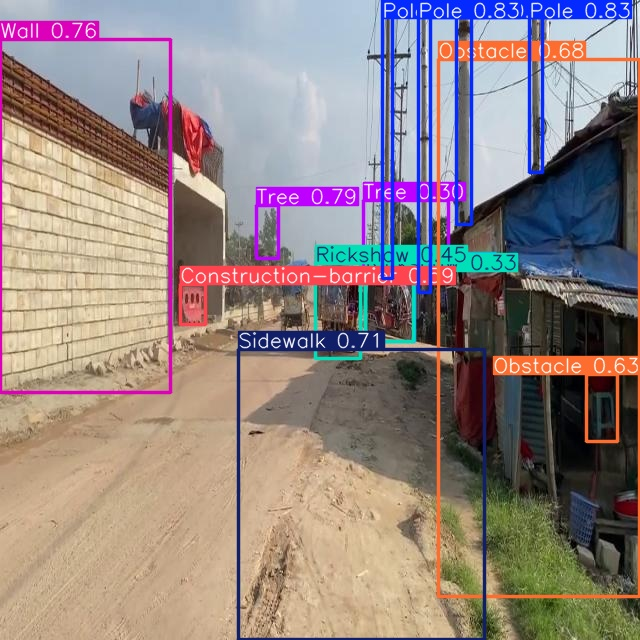

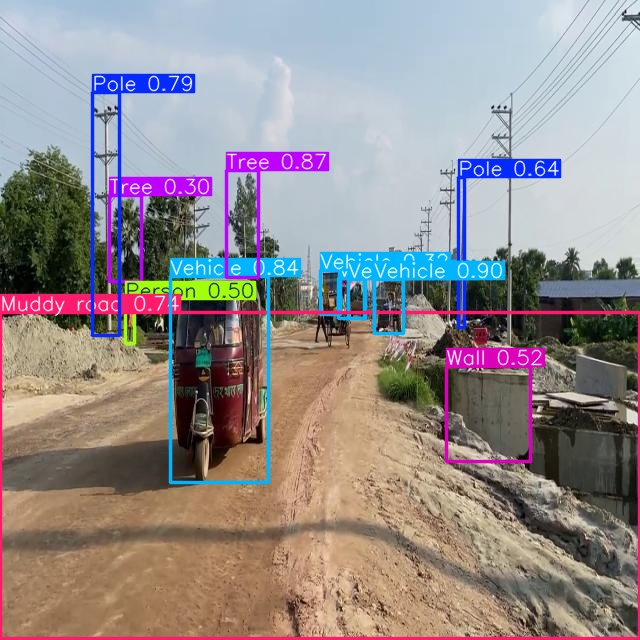

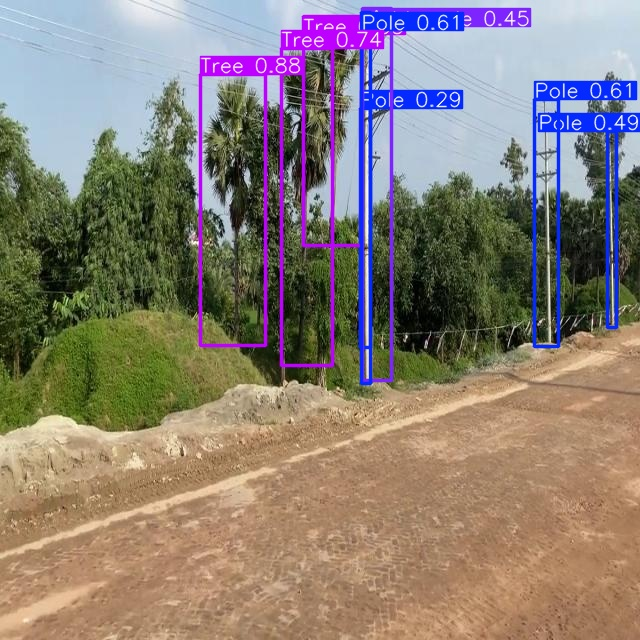

In [28]:
from IPython.display import Image, display
import os

folder = "/content/runs/detect/predict"

for img in os.listdir(folder):
    display(Image(filename=f"{folder}/{img}"))

In [29]:
!zip -r predictions.zip /content/runs/detect/predict

  adding: content/runs/detect/predict/ (stored 0%)
  adding: content/runs/detect/predict/4K-Bangladeshi-walking-tour-Dhaka-city-2023-Bason-Thana-Gazipur-Walking-Tour-2023_732_jpg.rf.f078c3634c90533e8b8f36d3c3be515f.jpg (deflated 4%)
  adding: content/runs/detect/predict/4K-Bangladeshi-walking-tour-Dhaka-city-2023-Bason-Thana-Gazipur-Walking-Tour-2023_613_jpg.rf.b639269cc0db53bfdeb6582eaceaab36.jpg (deflated 5%)
  adding: content/runs/detect/predict/4K-Bangladeshi-walking-tour-Dhaka-city-2023-Bason-Thana-Gazipur-Walking-Tour-2023_440_jpg.rf.fe56e684a9514a6d3cd859f4cf55f0b7.jpg (deflated 3%)
  adding: content/runs/detect/predict/4K-Bangladeshi-walking-tour-Dhaka-city-2023-Bason-Thana-Gazipur-Walking-Tour-2023_234_jpg.rf.85f80f1825842d8da645f55cdb29eb56.jpg (deflated 4%)
  adding: content/runs/detect/predict/4K-Bangladeshi-walking-tour-Dhaka-city-2023-Bason-Thana-Gazipur-Walking-Tour-2023_205_jpg.rf.f6fd69418cb6497e16c7c7c775a361d4.jpg (deflated 4%)
  adding: content/runs/detect/predict/4

In [30]:
from google.colab import files
files.download("predictions.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>